In [1]:
# @title
### EP 1 MAC0417 / MAC5768 ##################################################
#  AO PREENCHER ESSE CABEÇALHO COM O MEU NOME E O MEU NÚMERO USP,              #
#  DECLARO QUE SOU O ÚNICO AUTOR E RESPONSÁVEL PELAS RESPOSTAS NESTA LISTA.    #
#  TODAS AS PARTES FORAM DESENVOLVIDAS E IMPLEMENTADAS POR MIM, SEGUINDO AS    #
#  INSTRUÇÕES E QUE PORTANTO, NÃO CONSTITUEM DESONESTIDADE ACADÊMICA OU PLÁGIO.#
#                                                                              #
#  DECLARO TAMBÉM QUE SOU RESPONSÁVEL POR TODAS AS CÓPIAS                      #
#  DESSE PROGRAMA E QUE EU NÃO DISTRIBUI OU FACILITEI A                        #
#  SUA DISTRIBUIÇÃO. ESTOU CIENTE QUE OS CASOS DE PLÁGIO E                     #
#  DESONESTIDADE ACADÊMICA SERÃO TRATADOS SEGUNDO OS CRITÉRIOS                 #
#  DEFINIDOS NO CÓDIGO DE ÉTICA DA USP.                                        #
#  ENTENDO QUE LISTAS SEM ASSINATURA NÃO SERÃO CORRIGIDAS E,                   #
#  AINDA ASSIM, PODERÃO SER PUNIDOS POR DESONESTIDADE ACADÊMICA.               #
#                                                                              #
#  Nome : Luiz Gustavo Pina de Sales                                           #
#  NUSP : 10736991                                                             #
#  Turma: 2024145                                                              #
#  Prof.: Ronaldo Fumio Hashimoto                                              #
################################################################################

# EP 1 - MAC0417/MAC5768 - Visão e Processamento de Imagens

In [2]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import numpy as np
import pandas
import os 

In [3]:
#Código adaptado da Lista 1
def plot_img(fig, titulo):
  plt.figure(figsize=(3,3))
  plt.imshow(fig)
  plt.title(titulo)
  plt.show()

## Código principal para aquisição das imagens

No código abaixo temos um banco de imagens que irá conter um dicionário com a seguinte hierarquia de chaves:

    Classe -> Tempo -> Local -> Fundo -> Imagens

Todas as outras funções irão acessar as imagens através deste dicionário.

In [4]:
bancoImagens = {}
quantidadeClasses = 0
quantidadeImagens = 0
resolucaoImagens = ""

def loadImages(path, quantidadeClasses, quantidadeImagens, resolucaoImagens):
    classes = os.listdir(path)
    quantidadeClasses = len(classes)

    for classe in classes:

        bancoImagens[classe] = {}
        imagens = os.listdir(path+classe)

        for imagem in imagens:
            subclasses = imagem.split(",")
            currentLevel = bancoImagens[classe]
            for subclasseIndex in range(len(subclasses)-1):
                if(subclasses[subclasseIndex] not in currentLevel): 
                    currentLevel[subclasses[subclasseIndex]] = {}
                    currentLevel = currentLevel[subclasses[subclasseIndex]]
                else: currentLevel = currentLevel[subclasses[subclasseIndex]] 

            currentLevel[subclasses[-1].strip()] = imread(path+classe+"/"+imagem)
            quantidadeImagens += 1
            resolucaoImagens = f"{len(currentLevel[subclasses[-1].strip()])}x{len(currentLevel[subclasses[-1].strip()][0])}"
    return quantidadeClasses, quantidadeImagens, resolucaoImagens      
quantidadeClasses, quantidadeImagens, resolucaoImagens = loadImages("./Banco de Imagens/", quantidadeClasses, quantidadeImagens, resolucaoImagens)

## Função principal para imprimir as imagens de acordo com suas classes

O dicionário bancoImagens será percorrido para adquirir as imagens e classificar suas impressões de acordo com suas classes e subclasses.

In [5]:
def imprimeImagensPorClasse():
    for classe in bancoImagens.keys():
        for tempo in bancoImagens[classe].keys():
            for iluminacao in bancoImagens[classe][tempo].keys():
                for fundo in bancoImagens[classe][tempo][iluminacao].keys():
                    for exemplo in bancoImagens[classe][tempo][iluminacao][fundo].keys():
                        plot_img(bancoImagens[classe][tempo][iluminacao][fundo][exemplo], f"Classe: {classe}\nTempo: {tempo}\nLocal: {iluminacao}\nFundo: {fundo}")
                        break

In [6]:
def tamanhoBanco(path):
    tamanhoBanco = 0
    for pasta, _, arquivos in os.walk(path):
        for arquivo in arquivos:
            tamanhoBanco += os.path.getsize(os.path.join(pasta, arquivo))
    return tamanhoBanco

In [7]:
def imprimeTabelaSumariaDeDados():
    print("\n================================================================\n")
    print("Tabela Global Sumária:\n")
    classes = list(bancoImagens.keys())
    nomeClasses = ', '.join(classes)
    print(f" - Classes: {nomeClasses}")
    print(f" - Número de Classes: {quantidadeClasses}")
    print(f" - Número de Imagens: {quantidadeImagens}")
    print(f" - Tamanho do Banco de Dados: {(tamanhoBanco('./Banco de Imagens/')/(1024*1024))}")
    print(f" - Resolução das Imagens: {resolucaoImagens}") 
    print("\n================================================================\n")
    

In [8]:
def imprimeTabelaDetalhadaDeDados():
    print("\n=============================================================================\n")
    print("Tabela Detalhada de Dados:\n")
    dados = pandas.DataFrame({"Classe": [],
                         "N°Objetos": [], "N°Fundos": [],
                         "N°Iluminações": [], "N°repetições": [], 
                         "Total": []})
    classes = bancoImagens.keys()
    for classe in classes:
        totalAmostras = 0
        contadorRepeticoes = 0
        totalFundos = []
        totalTempos = []
        totalLocais = []
        tempos = bancoImagens[classe].keys()
        for tempo in tempos:
            if tempo not in totalTempos: totalTempos.append(tempo)
            for local in bancoImagens[classe][tempo].keys():
                if local not in totalLocais: totalLocais.append(local)
                for fundo in bancoImagens[classe][tempo][local].keys():
                    if fundo not in totalFundos: totalFundos.append(fundo)
                    contadorRepeticoes = len(bancoImagens[classe][tempo][local].keys())
                    
        contadorFundos = len(totalFundos)
        contadorIluminacoes = len(totalTempos)*len(totalLocais)
        totalAmostras += contadorIluminacoes*contadorFundos*contadorRepeticoes
                    
        dados = pandas.concat([dados, pandas.DataFrame({"Classe": classe, "N°Objetos": 1, "N°Fundos": contadorFundos,
        "N°Iluminações": contadorIluminacoes, "N°repetições": contadorRepeticoes,
         "Total": totalAmostras}, index=[0])], ignore_index = True)
    print(dados)
    print("\n===========================================================================\n")


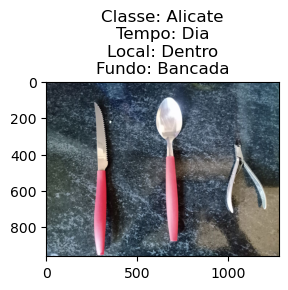

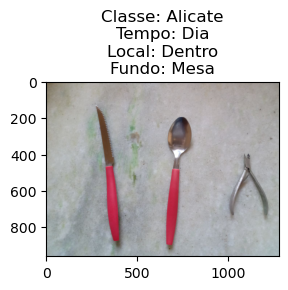

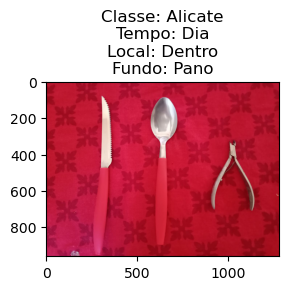

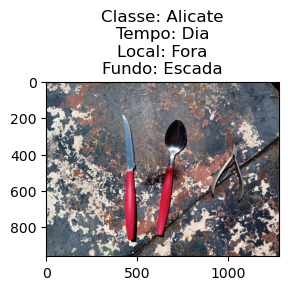

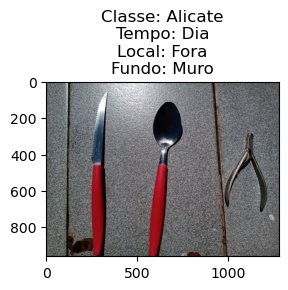

...

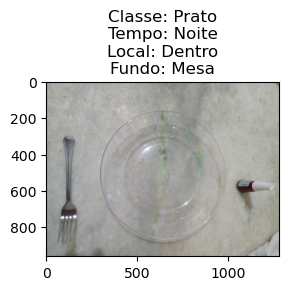

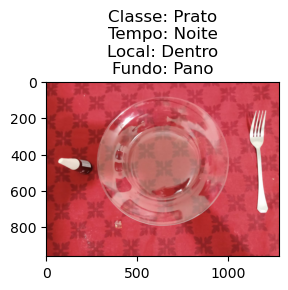

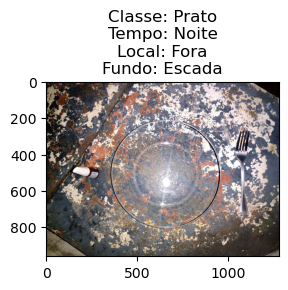

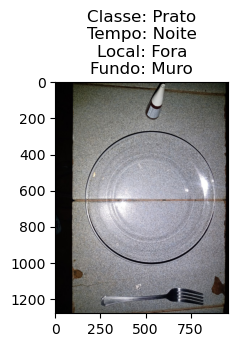

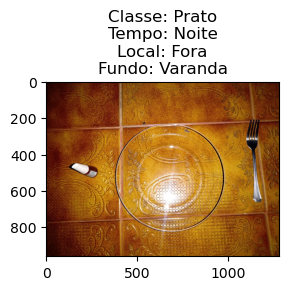

In [9]:
imprimeImagensPorClasse()

In [10]:
imprimeTabelaSumariaDeDados()



Tabela Global Sumária:

 - Classes: Alicate, Caneta, Colher, Controle, Esmalte, Faca, Garfo, Lixa, Moeda, Prato
 - Número de Classes: 10
 - Número de Imagens: 360
 - Tamanho do Banco de Dados: 88.66019248962402
 - Resolução das Imagens: 960x1280




In [11]:
imprimeTabelaDetalhadaDeDados()



Tabela Detalhada de Dados:

     Classe  N°Objetos  N°Fundos  N°Iluminações  N°repetições  Total
0   Alicate        1.0       6.0            4.0           3.0   72.0
1    Caneta        1.0       6.0            4.0           3.0   72.0
2    Colher        1.0       6.0            4.0           3.0   72.0
3  Controle        1.0       6.0            4.0           3.0   72.0
4   Esmalte        1.0       6.0            4.0           3.0   72.0
5      Faca        1.0       6.0            4.0           3.0   72.0
6     Garfo        1.0       6.0            4.0           3.0   72.0
7      Lixa        1.0       6.0            4.0           3.0   72.0
8     Moeda        1.0       6.0            4.0           3.0   72.0
9     Prato        1.0       6.0            4.0           3.0   72.0


